# Customer Segmentation

|Feature|Explanation|
|--|--|
|1. CUST_ID|Credit card holder ID|
|2. BALANCE|Monthly average balance (based on daily balance averages)
|3. BALANCE_FREQUENCY|	Ratio of last 12 months with balance. (1: Frequently updated, 0: Not frequently updated)|
|4. PURCHASES|	Total purchase amount spent during last 12 months|
|5. ONEOFF_PURCHASES|	Total amount of one-off purchases|
|6. INSTALLMENTS_PURCHASES|	Total amount of installment purchases|
|7. CASH_ADVANCE|	Total cash-advance amount|
|8. PURCHASES_FREQUENCY|	Frequency of purchases (Percent of months with at least one purchase). (1: Frequently purchased, 0: Not frequently purchased)|
|9. ONEOFF_PURCHASES_FREQUENCY|	Frequency of one-off-purchases. (1: Frequently purchased, 0: Not frequently purchased)|
|10. PURCHASES_INSTALLMENTS_FREQUENCY |	Frequency of installment purchases. (1: Frequently purchased, 0: Not frequently purchased)|
|11. CASHADVANCE_FREQUENCY|	Cash-Advance frequency|
|12. CASH_ADVANCE_TRX|	Average amount per cash-advance transaction|
|13. PURCHASES_TRX|	Average amount per purchase transaction|
|14. CREDIT_LIMIT|	Credit limit|
|15. PAYMENTS|	Total payments (Due amount paid by the customer to decrease their statement balance) in the period|
|16. MINIMUM_PAYMENTS|	Total minimum payments due in the period|
|17. PRC_FULL_PAYMEN|	Percentage of months with full payment of the due statement balance|
|18. TENURE|	Number of months as a customer|

In [738]:
import numpy as np
import pandas as pd
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
import time

import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap


from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn import datasets, metrics

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [212]:
df = pd.read_csv('Customer_Data.csv')
df.info()
df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## Exploratory Data Analysis

In [214]:
df.isnull().sum()*100/len(df)

CUST_ID                             0.000000
BALANCE                             0.000000
BALANCE_FREQUENCY                   0.000000
PURCHASES                           0.000000
ONEOFF_PURCHASES                    0.000000
INSTALLMENTS_PURCHASES              0.000000
CASH_ADVANCE                        0.000000
PURCHASES_FREQUENCY                 0.000000
ONEOFF_PURCHASES_FREQUENCY          0.000000
PURCHASES_INSTALLMENTS_FREQUENCY    0.000000
CASH_ADVANCE_FREQUENCY              0.000000
CASH_ADVANCE_TRX                    0.000000
PURCHASES_TRX                       0.000000
CREDIT_LIMIT                        0.011173
PAYMENTS                            0.000000
MINIMUM_PAYMENTS                    3.497207
PRC_FULL_PAYMENT                    0.000000
TENURE                              0.000000
dtype: float64

In [215]:
for col in ['CREDIT_LIMIT','MINIMUM_PAYMENTS']:
    df.loc[:, col] = df.loc[:, col].fillna(df.loc[:, col].mean())

In [216]:
df.isnull().sum()*100/len(df)

CUST_ID                             0.0
BALANCE                             0.0
BALANCE_FREQUENCY                   0.0
PURCHASES                           0.0
ONEOFF_PURCHASES                    0.0
INSTALLMENTS_PURCHASES              0.0
CASH_ADVANCE                        0.0
PURCHASES_FREQUENCY                 0.0
ONEOFF_PURCHASES_FREQUENCY          0.0
PURCHASES_INSTALLMENTS_FREQUENCY    0.0
CASH_ADVANCE_FREQUENCY              0.0
CASH_ADVANCE_TRX                    0.0
PURCHASES_TRX                       0.0
CREDIT_LIMIT                        0.0
PAYMENTS                            0.0
MINIMUM_PAYMENTS                    0.0
PRC_FULL_PAYMENT                    0.0
TENURE                              0.0
dtype: float64

In [217]:
df.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

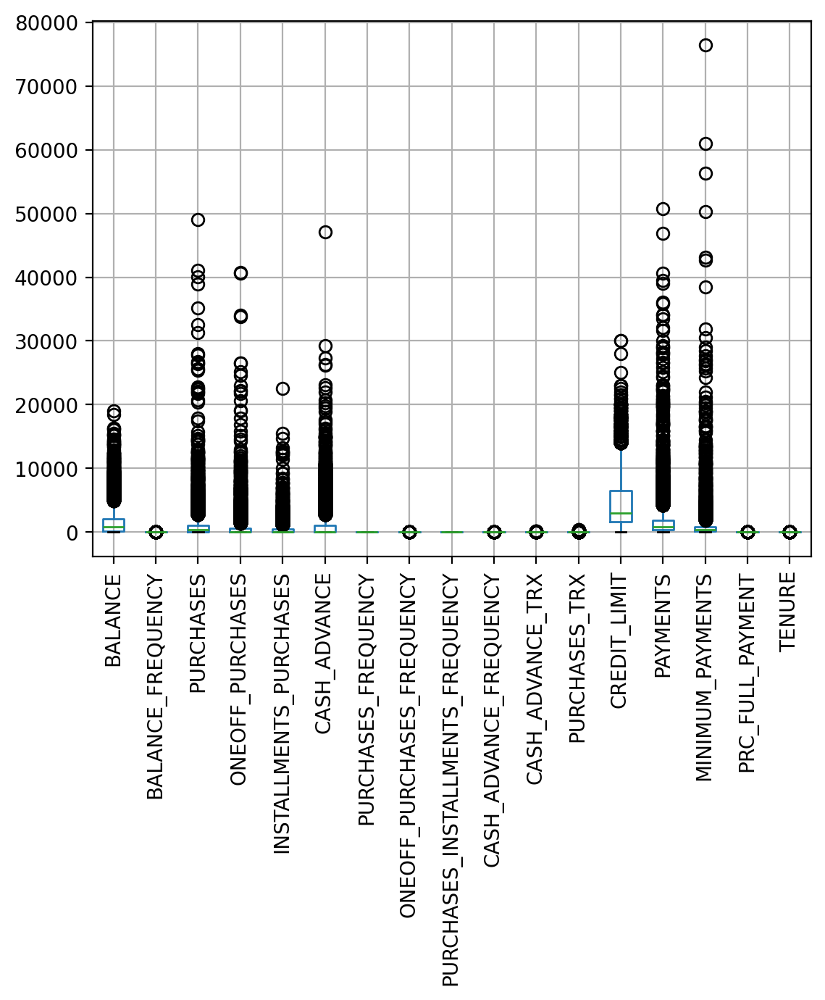

In [998]:
plt.figure(dpi=200)
df.boxplot(figsize=(15,10))
plt.xticks(rotation=90)
plt.show()

A closer look at some features:

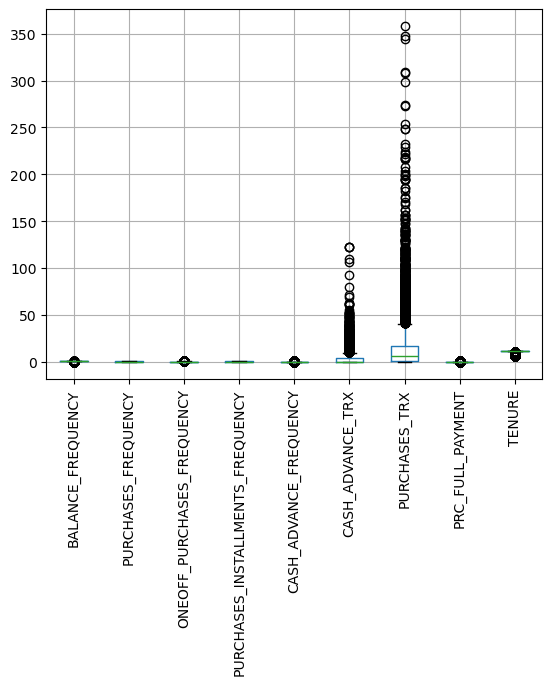

In [220]:
df[['BALANCE_FREQUENCY','PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX','PRC_FULL_PAYMENT', 'TENURE']].boxplot()
plt.xticks(rotation=90)
plt.show()

In [221]:
q75, q25 = np.percentile(df['MINIMUM_PAYMENTS'], [75 ,25])
iqr = q75 - q25

for threshold in np.arange(1,5,0.5):
    min_val = q25 - (iqr*threshold)
    max_val = q75 + (iqr*threshold)
    print("The score threshold is: {}".format(threshold))
    print("Number of outliers is: {}".format(
        len((np.where((df['MINIMUM_PAYMENTS'] > max_val) 
                      | (df['MINIMUM_PAYMENTS'] < min_val))[0]))
    ))

The score threshold is: 1.0
Number of outliers is: 1038
The score threshold is: 1.5
Number of outliers is: 774
The score threshold is: 2.0
Number of outliers is: 602
The score threshold is: 2.5
Number of outliers is: 484
The score threshold is: 3.0
Number of outliers is: 387
The score threshold is: 3.5
Number of outliers is: 319
The score threshold is: 4.0
Number of outliers is: 272
The score threshold is: 4.5
Number of outliers is: 242


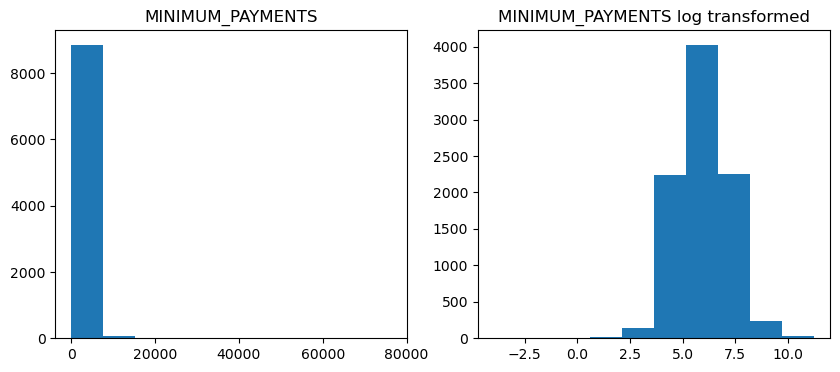

In [222]:
MINIMUM_PAYMENTS = np.log(df['MINIMUM_PAYMENTS'])

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(df['MINIMUM_PAYMENTS'])
plt.title('MINIMUM_PAYMENTS')

plt.subplot(1,2,2)
plt.hist(MINIMUM_PAYMENTS)
plt.title('MINIMUM_PAYMENTS log transformed')
plt.show()

In [223]:
q75, q25 = np.percentile(df['PURCHASES'], [75 ,25])
iqr = q75 - q25

for threshold in np.arange(1,5,0.5):
    min_val = q25 - (iqr*threshold)
    max_val = q75 + (iqr*threshold)
    print("The score threshold is: {}".format(threshold))
    print("Number of outliers is: {}".format(
        len((np.where((df['PURCHASES'] > max_val) 
                      | (df['PURCHASES'] < min_val))[0]))
    ))

The score threshold is: 1.0
Number of outliers is: 1107
The score threshold is: 1.5
Number of outliers is: 808
The score threshold is: 2.0
Number of outliers is: 619
The score threshold is: 2.5
Number of outliers is: 486
The score threshold is: 3.0
Number of outliers is: 391
The score threshold is: 3.5
Number of outliers is: 309
The score threshold is: 4.0
Number of outliers is: 246
The score threshold is: 4.5
Number of outliers is: 202


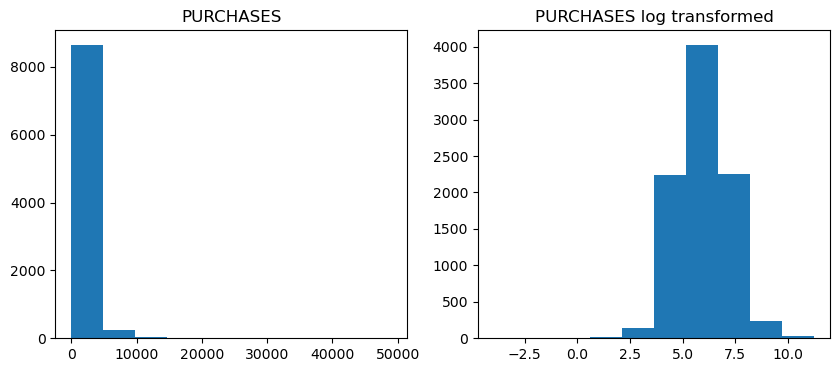

In [224]:
PURCHASES = np.log(df['PURCHASES'])

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(df['PURCHASES'])
plt.title('PURCHASES')

plt.subplot(1,2,2)
plt.hist(MINIMUM_PAYMENTS)
plt.title('PURCHASES log transformed')
plt.show()

In [225]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

## Outliers capping and transforming

In [227]:
from numpy import inf
col_list = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']

df_log = df.copy()

for col in col_list:
    df_log.loc[:,col] = np.log(df.loc[:,col])
    df_log.loc[:,col][df_log.loc[:,col] == -inf] = 0

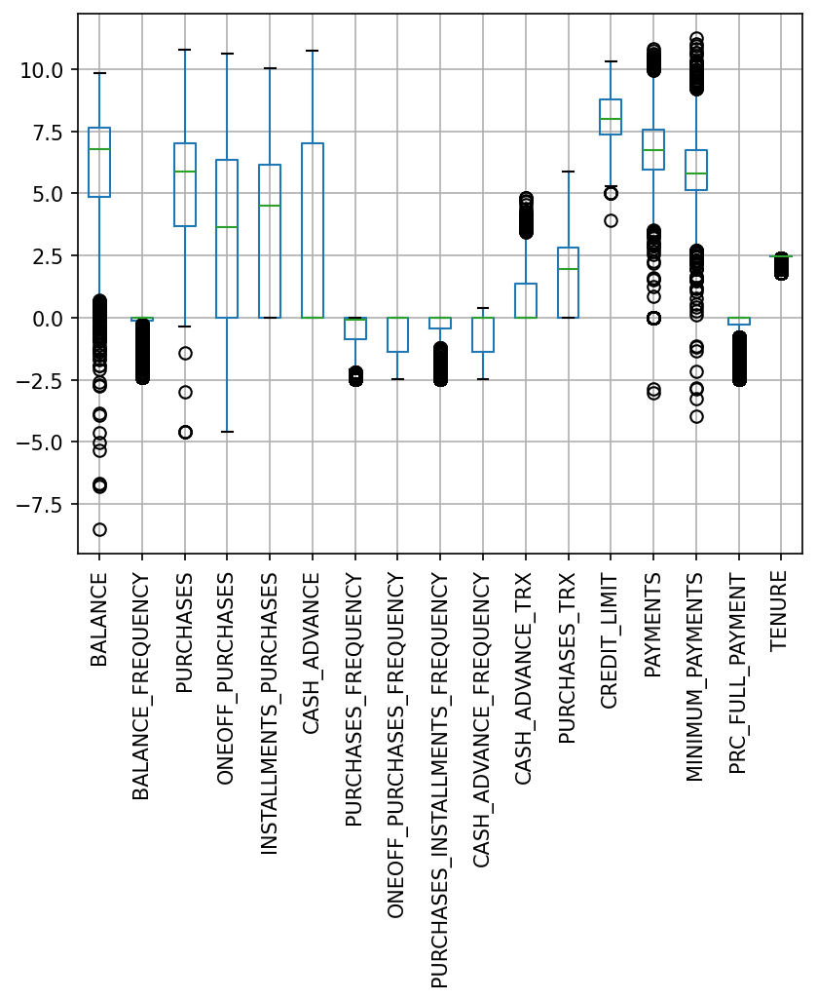

In [996]:
plt.figure(dpi=150)
df_log.boxplot(figsize=(18,10))
plt.xticks(rotation=90)
plt.show()

Testing the log-transform method:

In [230]:
q75, q25 = np.percentile(df_log['MINIMUM_PAYMENTS'], [75 ,25])
iqr = q75 - q25

for threshold in np.arange(1,5,0.5):
    min_val = q25 - (iqr*threshold)
    max_val = q75 + (iqr*threshold)
    print("The score threshold is: {}".format(threshold))
    print("Number of outliers is: {}".format(
        len((np.where((df_log['MINIMUM_PAYMENTS'] > max_val) 
                      | (df_log['MINIMUM_PAYMENTS'] < min_val))[0]))
    ))

The score threshold is: 1.0
Number of outliers is: 368
The score threshold is: 1.5
Number of outliers is: 137
The score threshold is: 2.0
Number of outliers is: 41
The score threshold is: 2.5
Number of outliers is: 18
The score threshold is: 3.0
Number of outliers is: 9
The score threshold is: 3.5
Number of outliers is: 8
The score threshold is: 4.0
Number of outliers is: 5
The score threshold is: 4.5
Number of outliers is: 4


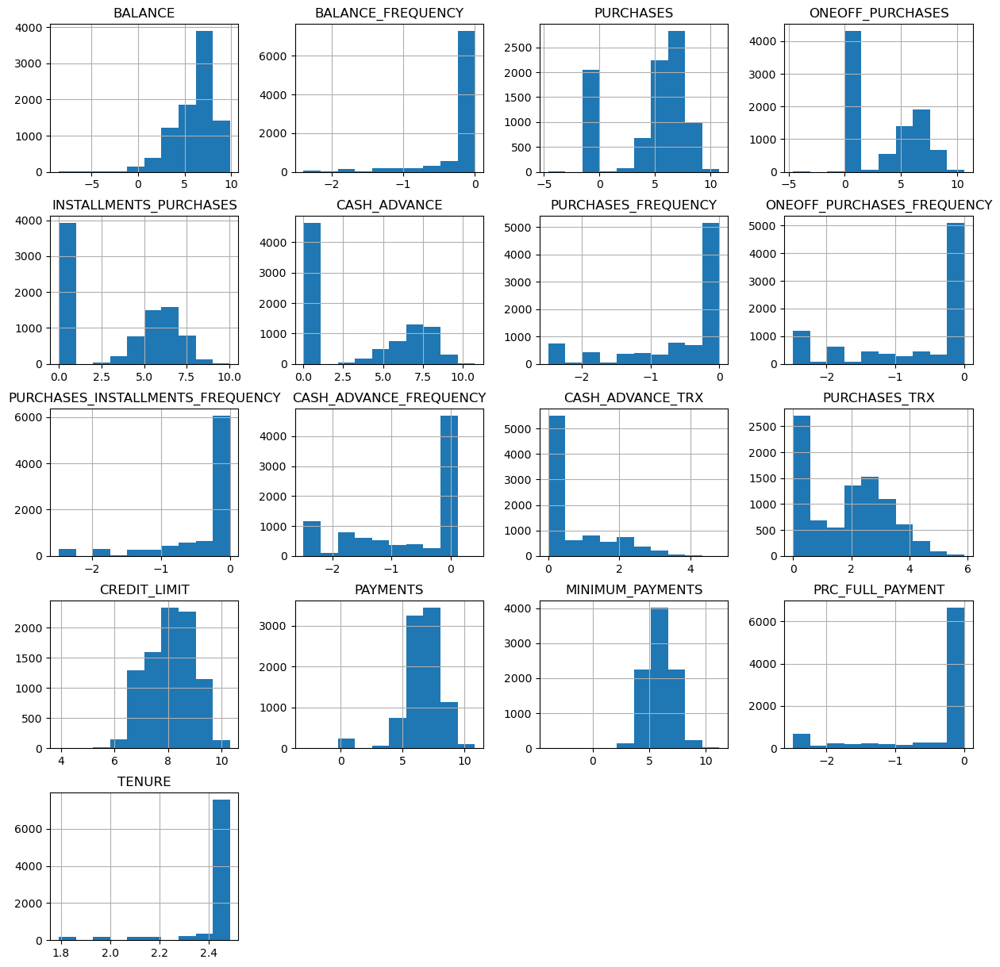

In [231]:
df_log.hist(figsize=(15,15))
plt.show()

### Winsorizing

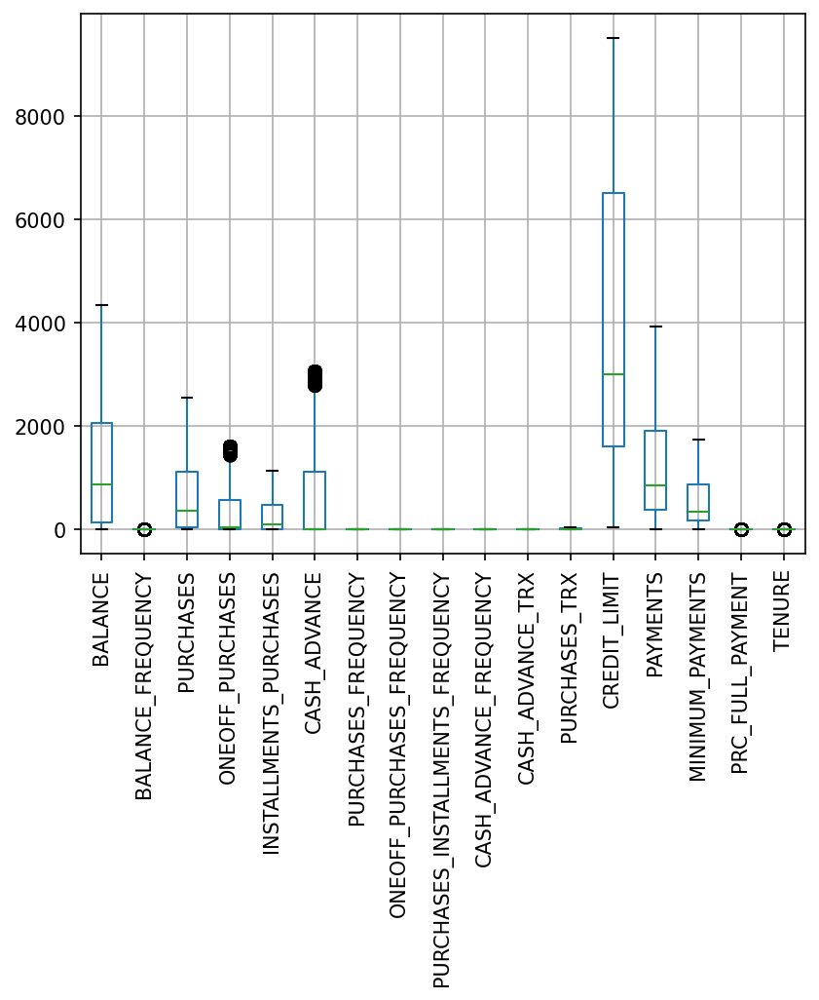

In [1259]:
from scipy.stats.mstats import winsorize

col_list = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']

df_win = df.copy()

for col in col_list:
    df_win.loc[:,col] = winsorize(df.loc[:,col], (0, 0.10))

plt.figure(dpi=150)
df_win.boxplot(figsize=(15,10))
plt.xticks(rotation=90)
plt.show()

In [234]:
q75, q25 = np.percentile(df_win['MINIMUM_PAYMENTS'], [75 ,25])
iqr = q75 - q25

for threshold in np.arange(1,5,0.5):
    min_val = q25 - (iqr*threshold)
    max_val = q75 + (iqr*threshold)
    print("The score threshold is: {}".format(threshold))
    print("Number of outliers is: {}".format(
        len((np.where((df_win['MINIMUM_PAYMENTS'] > max_val) 
                      | (df_win['MINIMUM_PAYMENTS'] < min_val))[0]))
    ))

The score threshold is: 1.0
Number of outliers is: 1038
The score threshold is: 1.5
Number of outliers is: 0
The score threshold is: 2.0
Number of outliers is: 0
The score threshold is: 2.5
Number of outliers is: 0
The score threshold is: 3.0
Number of outliers is: 0
The score threshold is: 3.5
Number of outliers is: 0
The score threshold is: 4.0
Number of outliers is: 0
The score threshold is: 4.5
Number of outliers is: 0


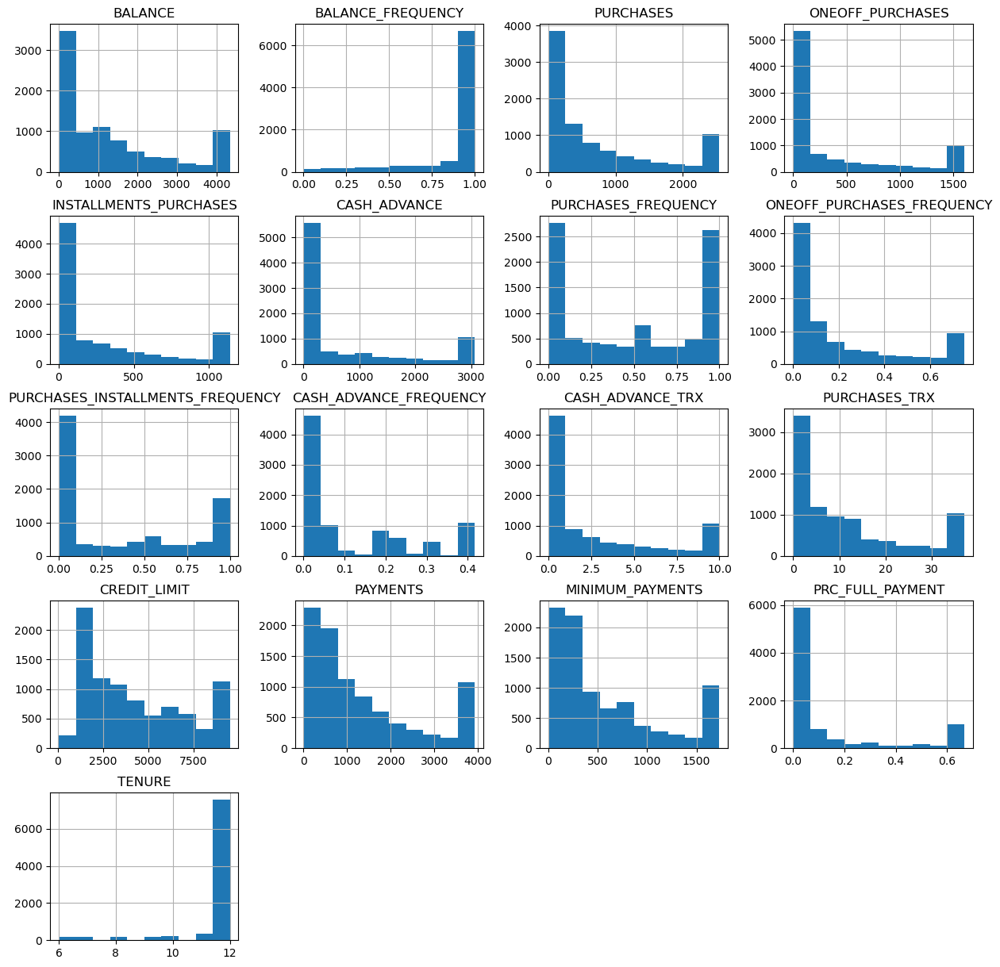

In [254]:
df_win.hist(figsize=(15,15))
plt.show()

According to Tukey's method, the `log-transform` has better results than `winsorization` but the box plots show fewer outliers by the winsorize method. 

In [265]:
df_log.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,6.134084,-0.180695,4.893297,3.195943,3.349343,3.317585,-0.542813,-0.678943,-0.349671,-0.738587,0.673128,1.764821,8.094442,6.621625,5.944137,-0.395482,2.434805
std,2.087841,0.415785,2.924085,3.254105,3.081928,3.565724,0.782683,0.915468,0.613402,0.914072,0.985175,1.428408,0.819988,1.597164,1.199998,0.767139,0.144964
min,-8.522206,-2.397896,-4.605170,-4.605170,0.000000,0.000000,-2.484911,-2.484911,-2.484911,-2.484911,0.000000,0.000000,3.912023,-3.005520,-3.954774,-2.484911,1.791759
25%,4.854230,-0.105361,3.679710,0.000000,0.000000,0.000000,-0.875468,-1.386294,-0.451985,-1.386294,0.000000,0.000000,7.377759,5.948756,5.140831,-0.287682,2.484907
50%,6.772377,0.000000,5.889653,3.637586,4.488636,0.000000,-0.087011,0.000000,0.000000,0.000000,0.000000,1.945910,8.006368,6.753323,5.816004,0.000000,2.484907
75%,7.627613,0.000000,7.012232,6.358543,6.149830,7.015552,0.000000,0.000000,0.000000,0.000000,1.386294,2.833213,8.779557,7.550206,6.761812,0.000000,2.484907
max,9.854462,0.000000,10.800383,10.615487,10.021271,10.760818,0.000000,0.000000,0.000000,0.405465,4.812184,5.880533,10.308953,10.834105,11.243819,0.000000,2.484907


In [567]:
df_log.corr(numeric_only=True)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.566396,-0.064627,0.183463,-0.104555,0.510769,0.152111,-0.025654,0.142112,-0.304110,0.463396,0.016020,0.292375,0.428506,0.710917,0.124820,0.072631
BALANCE_FREQUENCY,0.566396,1.000000,0.105067,0.114495,0.129327,0.133332,0.292655,0.069053,0.141093,-0.049308,0.164398,0.232216,0.079740,0.292497,0.338314,-0.022513,0.094586
PURCHASES,-0.064627,0.105067,1.000000,0.683752,0.685146,-0.495206,-0.120681,-0.301689,-0.208805,0.443353,-0.343502,0.840547,0.187116,0.208995,-0.055220,-0.047927,0.102307
ONEOFF_PURCHASES,0.183463,0.114495,0.683752,1.000000,0.161664,-0.189745,-0.190226,-0.522254,-0.054194,0.183861,-0.113319,0.536728,0.283752,0.268048,0.052356,-0.015178,0.089456
INSTALLMENTS_PURCHASES,-0.104555,0.129327,0.685146,0.161664,1.000000,-0.393944,0.287761,0.043926,-0.325234,0.343352,-0.279447,0.783831,0.106641,0.165971,-0.046596,-0.078969,0.095356
CASH_ADVANCE,0.510769,0.133332,-0.495206,-0.189745,-0.393944,1.000000,0.113774,0.084688,0.174978,-0.724700,0.800431,-0.394929,0.119705,0.182422,0.393041,-0.009335,-0.097035
PURCHASES_FREQUENCY,0.152111,0.292655,-0.120681,-0.190226,0.287761,0.113774,1.000000,0.606580,0.279254,-0.109982,0.068081,0.336011,0.047978,0.177505,0.073734,-0.066181,-0.035134
ONEOFF_PURCHASES_FREQUENCY,-0.025654,0.069053,-0.301689,-0.522254,0.043926,0.084688,0.606580,1.000000,0.024428,-0.082039,0.038161,0.005695,-0.035507,0.004285,-0.004834,-0.018782,-0.056592
PURCHASES_INSTALLMENTS_FREQUENCY,0.142112,0.141093,-0.208805,-0.054194,-0.325234,0.174978,0.279254,0.024428,1.000000,-0.164357,0.114294,-0.080147,-0.020441,0.065233,0.072908,0.010814,-0.052714
CASH_ADVANCE_FREQUENCY,-0.304110,-0.049308,0.443353,0.183861,0.343352,-0.724700,-0.109982,-0.082039,-0.164357,1.000000,-0.253654,0.348493,0.061732,-0.024537,-0.217173,-0.007649,0.013166


## Feature Selection

In [776]:
df_log.loc[:, ~df_log.columns.isin(['CUST_ID'])].var().sort_values()

TENURE                               0.021014
BALANCE_FREQUENCY                    0.172877
PURCHASES_INSTALLMENTS_FREQUENCY     0.376263
PRC_FULL_PAYMENT                     0.588502
PURCHASES_FREQUENCY                  0.612593
CREDIT_LIMIT                         0.672381
CASH_ADVANCE_FREQUENCY               0.835527
ONEOFF_PURCHASES_FREQUENCY           0.838082
CASH_ADVANCE_TRX                     0.970570
MINIMUM_PAYMENTS                     1.439994
PURCHASES_TRX                        2.040350
PAYMENTS                             2.550934
BALANCE                              4.359078
PURCHASES                            8.550276
INSTALLMENTS_PURCHASES               9.498278
ONEOFF_PURCHASES                    10.589200
CASH_ADVANCE                        12.714389
dtype: float64

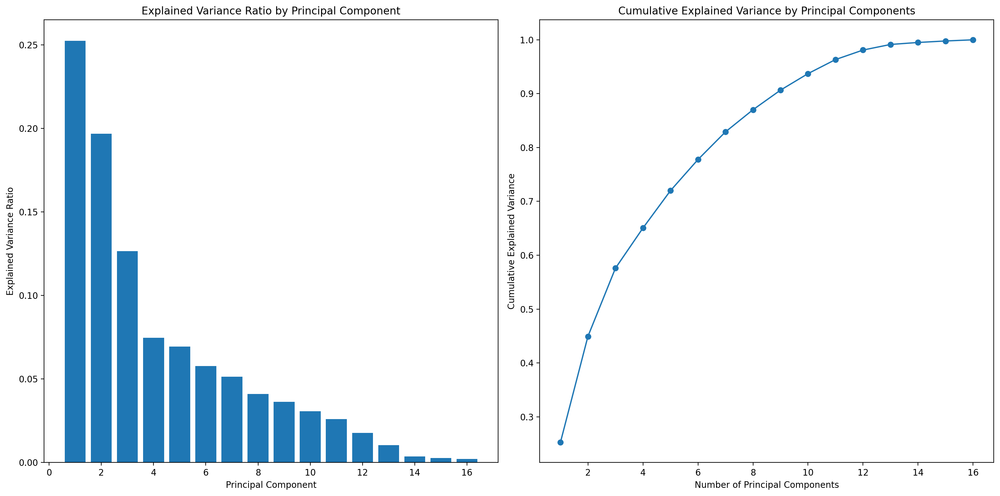

In [1266]:
# Perform PCA
pca = PCA()
X_pca = pca.fit_transform(X_std)

explained_variance_ratio = pca.explained_variance_ratio_

# Create a 2x1 grid of subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16, 8) , dpi=200)

# Plot the explained variance ratio in the first subplot
ax1.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
ax1.set_xlabel("Principal Component")
ax1.set_ylabel("Explained Variance Ratio")
ax1.set_title("Explained Variance Ratio by Principal Component")

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Plot the cumulative explained variance in the second subplot
ax2.plot(
    range(1, len(cumulative_explained_variance) + 1),
    cumulative_explained_variance,
    marker="o",
)
ax2.set_xlabel("Number of Principal Components")
ax2.set_ylabel("Cumulative Explained Variance")
ax2.set_title("Cumulative Explained Variance by Principal Components")

# Display the figure
plt.tight_layout()
plt.show()

In [778]:
explained_variance_ratio

array([0.23835168, 0.18778019, 0.11927893, 0.07098119, 0.06611109,
       0.06019926, 0.05402432, 0.04724229, 0.03599795, 0.03366639,
       0.02807723, 0.02427436, 0.01662062, 0.00950409, 0.00341781,
       0.0025017 , 0.00197089])

In [780]:
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))
features=sel.fit_transform(X)
features_df = pd.DataFrame(features)
sel.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False])

It seems that the only feature with very low variance is `TENURE`, which can be removed from the analysis.

In [785]:
df_select = df_log.loc[:,~df_log.columns.isin(['CUST_ID','TENURE'])]


In [801]:
#X = df_log.loc[:,~df_log.columns.isin(['CUST_ID'])]
X = df_select
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

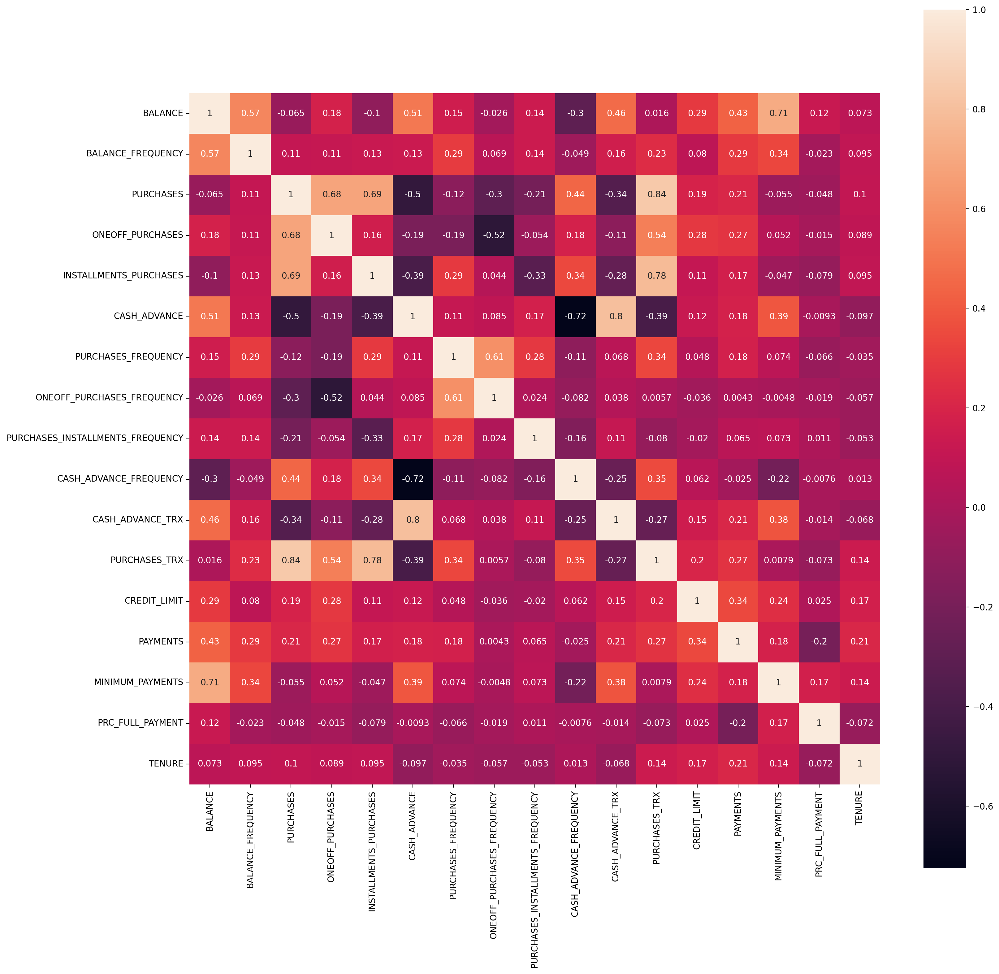

In [1262]:
plt.figure(figsize=(18,18),dpi=200)
sns.heatmap(df_log.loc[:,~df_log.columns.isin(['CUST_ID'])].corr(), square=True, annot=True)
plt.show()

## Clustering

### K-mean

In [803]:
for ncluster in range(2,10):
    kmean = KMeans(n_clusters=ncluster, random_state=123)
    kmean.fit(X_std)
    ypred_km = kmean.predict(X_std)
    print('Silhouette score for {} cluster k-means: {}'
          .format(ncluster, metrics.silhouette_score(X_std, ypred_km, metric='euclidean')))

Silhouette score for 2 cluster k-means: 0.21416306919544378
Silhouette score for 3 cluster k-means: 0.22595865531974535
Silhouette score for 4 cluster k-means: 0.22766950797072072
Silhouette score for 5 cluster k-means: 0.22158634861467105
Silhouette score for 6 cluster k-means: 0.22533373933591394
Silhouette score for 7 cluster k-means: 0.204322569808396
Silhouette score for 8 cluster k-means: 0.23125607833754352
Silhouette score for 9 cluster k-means: 0.21341443951834813


The lowest number of clusters with a hight Silhouette score is `4`.

In [889]:
kmeans_per_k = [KMeans(n_clusters=k, n_init=10, random_state=42).fit(X_std)
                for k in range(2, 10)]

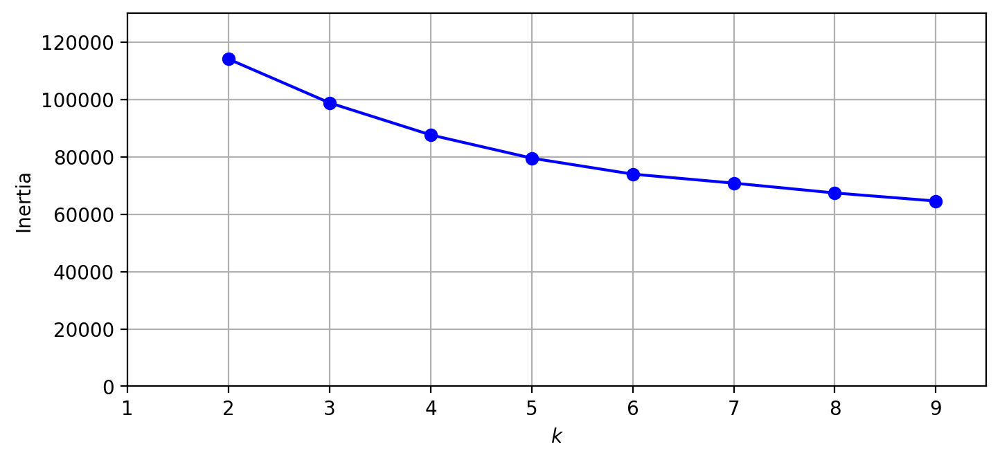

In [1271]:
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5),dpi=200)
plt.plot(range(2, 10), inertias, "bo-")
plt.xlabel("$k$")
plt.ylabel("Inertia")
#plt.annotate("", xy=(6, inertias[5]), xytext=(5.45, 40000),
#             arrowprops=dict(facecolor='black', shrink=0.1))
#plt.text(5.5, 37000, "Elbow", horizontalalignment="center")
plt.axis([1, 9.5, 0, 130000])
plt.grid()
plt.show()

No `elbow` is discernible in the above plot. So, let's plot the `Silhouette` score.

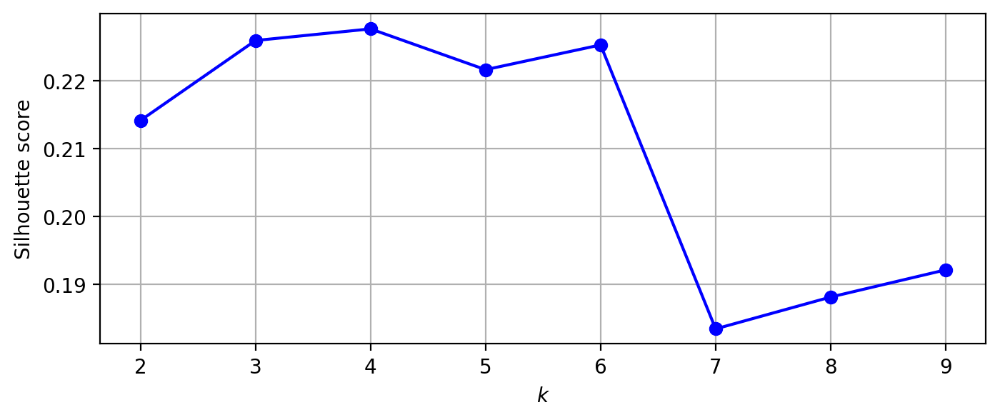

In [1269]:
silhouette_scores = [metrics.silhouette_score(X_std, model.labels_)
                     for model in kmeans_per_k[0:]]

plt.figure(figsize=(8, 3),dpi=200)
plt.plot(range(2, 10), silhouette_scores, "bo-")
plt.xlabel("$k$")
plt.ylabel("Silhouette score")
#plt.axis([1.8, 8.5, 0.55, 0.7])
plt.grid()
#save_fig("silhouette_score_vs_k_plot")
plt.show()

The above diagram shows that `k = 4` and `k = 6` are good choices.

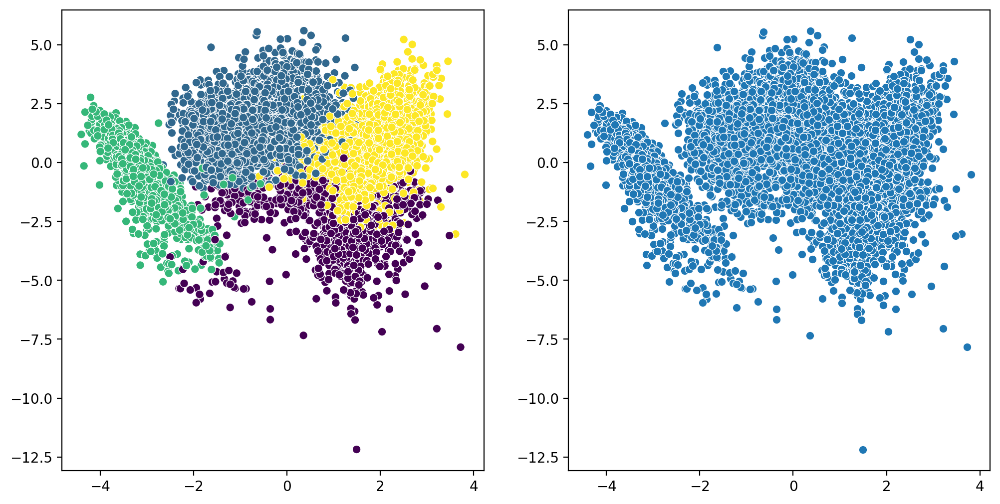

In [1283]:
kmean = KMeans(n_clusters=4, random_state=123)
kmean.fit(X_std)
ypred_km = kmean.predict(X_std) 

pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_std)

plt.figure(figsize=(12,6), dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], c=ypred_km)

plt.subplot(1,2,2)
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1])

plt.show()

#### t-SNE

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8950 samples in 0.006s...
[t-SNE] Computed neighbors for 8950 samples in 0.304s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8950
[t-SNE] Computed conditional probabilities for sample 2000 / 8950
[t-SNE] Computed conditional probabilities for sample 3000 / 8950
[t-SNE] Computed conditional probabilities for sample 4000 / 8950
[t-SNE] Computed conditional probabilities for sample 5000 / 8950
[t-SNE] Computed conditional probabilities for sample 6000 / 8950
[t-SNE] Computed conditional probabilities for sample 7000 / 8950
[t-SNE] Computed conditional probabilities for sample 8000 / 8950
[t-SNE] Computed conditional probabilities for sample 8950 / 8950
[t-SNE] Mean sigma: 0.672936
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.649139
[t-SNE] KL divergence after 300 iterations: 2.303859


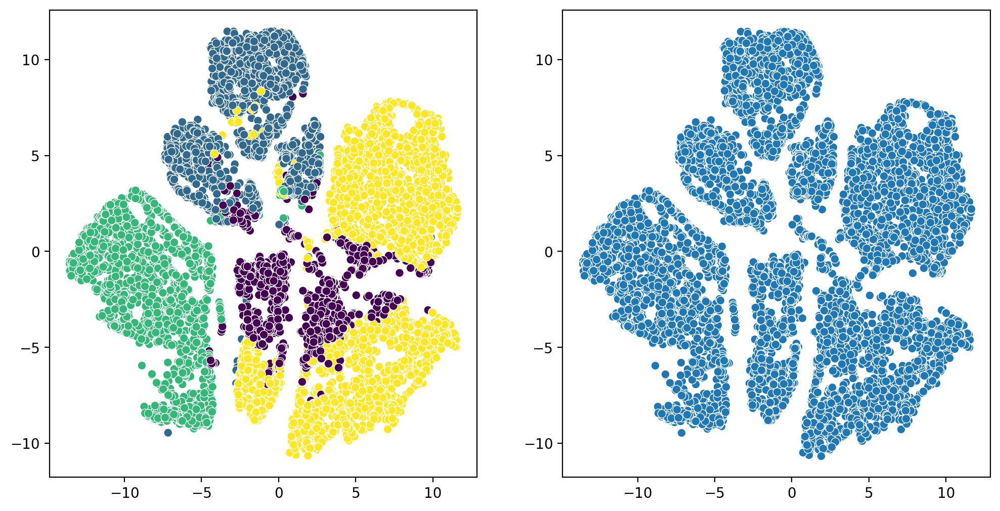

In [1285]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, max_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(12,6), dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], c=ypred_km)

plt.subplot(1,2,2)
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1])

plt.show()

By the `t-SNE` method we can clearly identify at leat `7` different groupings, while the `PCA` method only shows `2` different clusters.

In [957]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

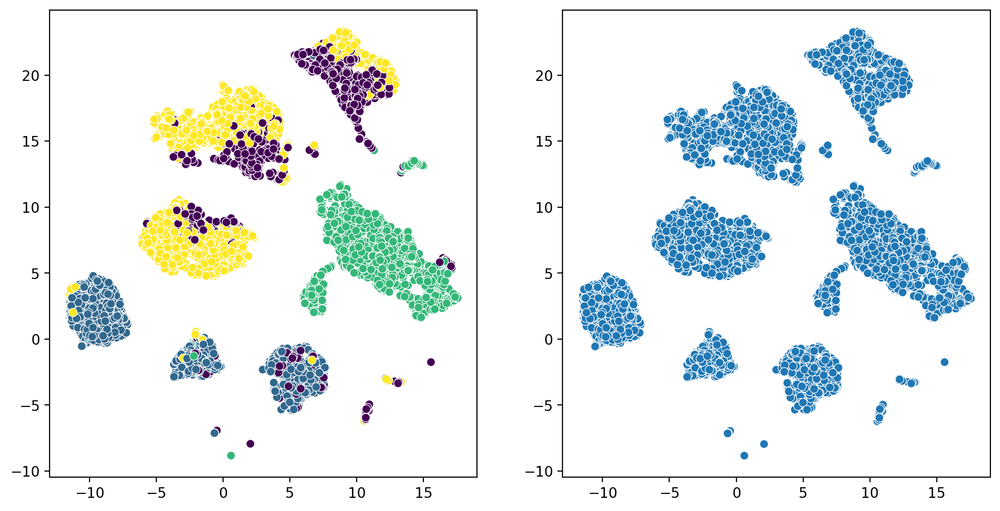

In [1289]:
plt.figure(figsize=(12,6), dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], c=ypred_km)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1])


plt.show()

Wonderful! With the `UMAP` method, the clusters are easily distinguishable.

#### Mini Batch K-means

In [817]:
for ncluster in range(2,10):
    mini_batch_k_means = MiniBatchKMeans(n_clusters=ncluster, random_state=123)
    mini_batch_k_means.fit(X_std)
    y_pred_mini = mini_batch_k_means.predict(X_std)
    print('Silhouette score for {} cluster Mini Batch k-means: {}'
          .format(ncluster, metrics.silhouette_score(X_std, y_pred_mini, metric='euclidean')))

Silhouette score for 2 cluster Mini Batch k-means: 0.21734748691349284
Silhouette score for 3 cluster Mini Batch k-means: 0.1902579112477346
Silhouette score for 4 cluster Mini Batch k-means: 0.2113561448569508
Silhouette score for 5 cluster Mini Batch k-means: 0.20873690842739592
Silhouette score for 6 cluster Mini Batch k-means: 0.22033155190571102
Silhouette score for 7 cluster Mini Batch k-means: 0.21952731111086793
Silhouette score for 8 cluster Mini Batch k-means: 0.17262720241762394
Silhouette score for 9 cluster Mini Batch k-means: 0.18018472548047623


In [819]:
mini_batch_k_means = MiniBatchKMeans(n_clusters=6, random_state=123)
mini_batch_k_means.fit(X_std)
y_pred_mini = mini_batch_k_means.predict(X_std)

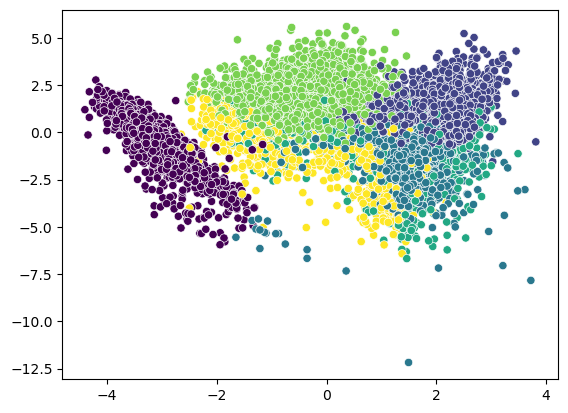

In [821]:
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], c=y_pred_mini)
plt.show()

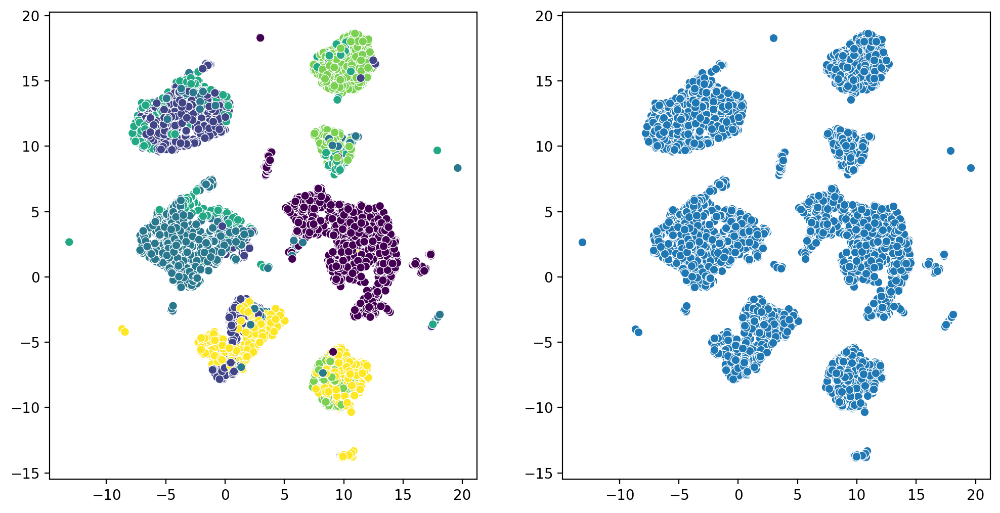

In [823]:
plt.figure(figsize=(12,6),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], c=y_pred_mini)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1])

plt.show()

### Hierarchical Clustering

In [1314]:
for ncluster in range(2,10):
    agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      metric='cosine',
                                      n_clusters=ncluster)
    clusters = agg_cluster.fit_predict(X_std)
    print('Silhouette score for {} cluster Agglomerative Clustering: {}'
          .format(ncluster, metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Silhouette score for 2 cluster Agglomerative Clustering: 0.19698372680356405
Silhouette score for 3 cluster Agglomerative Clustering: 0.15743001487978436
Silhouette score for 4 cluster Agglomerative Clustering: 0.13760678270246376
Silhouette score for 5 cluster Agglomerative Clustering: 0.12850841302718508
Silhouette score for 6 cluster Agglomerative Clustering: 0.1334273054234248
Silhouette score for 7 cluster Agglomerative Clustering: 0.13358620929442816
Silhouette score for 8 cluster Agglomerative Clustering: 0.16112623362240808
Silhouette score for 9 cluster Agglomerative Clustering: 0.16298197552155017


The highest Silhouette score is obtained by 2 clusters. However, as the `UMAP` solution shows, there are 7 distinguishable clusters.

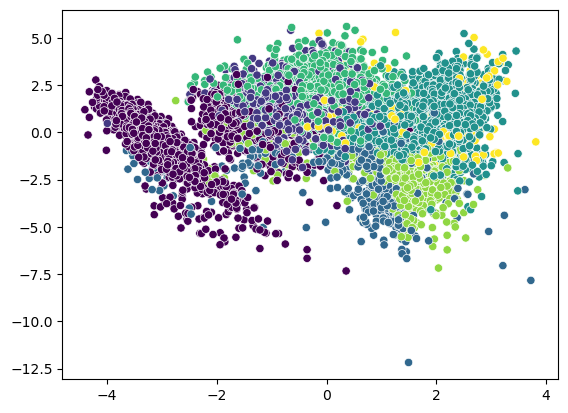

In [1316]:
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      metric='cosine',
                                      n_clusters=7)
clusters_agg = agg_cluster.fit_predict(X_std)

sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], c=clusters_agg)
plt.show()

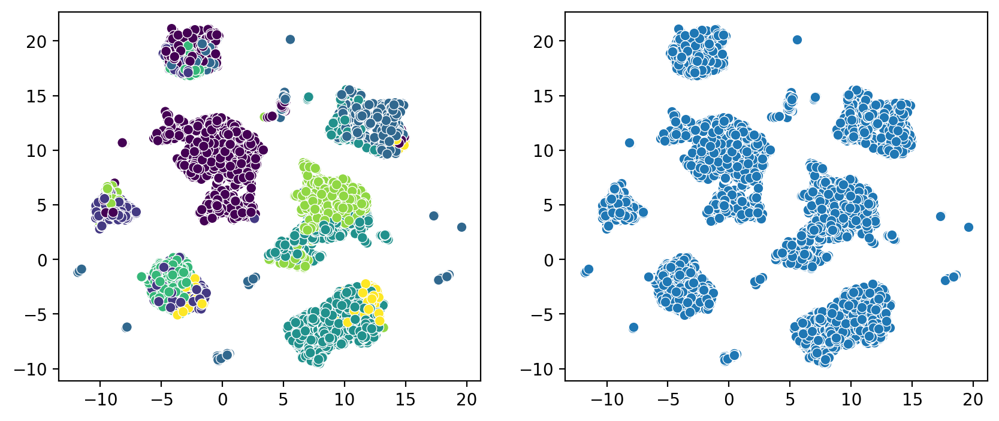

In [1326]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(10,4),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], c=clusters_agg)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1])

plt.show()

### DBSCAN Clustering

In [842]:
for i in np.arange(1,7, 0.5):
    dbscan_cluster = DBSCAN(eps = i, min_samples = 1, metric ='euclidean')
    clusters_dbscan = dbscan_cluster.fit_predict(X_std)

    print('Eps = {}, Number of clusters: {}'.format(i,len(np.unique(clusters_dbscan))))
    print("The silhouette score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, clusters_dbscan, metric='euclidean')))
    print('_'*50)

Eps = 1.0, Number of clusters: 2975
The silhouette score of the DBSCAN solution: -0.22784104533935026
__________________________________________________
Eps = 1.5, Number of clusters: 864
The silhouette score of the DBSCAN solution: -0.23201041293925517
__________________________________________________
Eps = 2.0, Number of clusters: 243
The silhouette score of the DBSCAN solution: -0.1672747704647679
__________________________________________________
Eps = 2.5, Number of clusters: 77
The silhouette score of the DBSCAN solution: -0.2186512398248027
__________________________________________________
Eps = 3.0, Number of clusters: 25
The silhouette score of the DBSCAN solution: 0.016567513144456817
__________________________________________________
Eps = 3.5, Number of clusters: 5
The silhouette score of the DBSCAN solution: 0.2855523352516702
__________________________________________________
Eps = 4.0, Number of clusters: 3
The silhouette score of the DBSCAN solution: 0.532661026117339

In [844]:
for j in range(2,51):
    dbscan_cluster = DBSCAN(eps = 1, min_samples = j, metric ='euclidean')
    clusters = dbscan_cluster.fit_predict(X_std)

    print('min_samples = {}, Number of clusters: {}'.format(j,len(np.unique(clusters))))
    print("The silhouette score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

min_samples = 2, Number of clusters: 369
The silhouette score of the DBSCAN solution: -0.2992484782644986
min_samples = 3, Number of clusters: 136
The silhouette score of the DBSCAN solution: -0.24455101604778617
min_samples = 4, Number of clusters: 80
The silhouette score of the DBSCAN solution: -0.16114806325809872
min_samples = 5, Number of clusters: 60
The silhouette score of the DBSCAN solution: -0.16977994947390418
min_samples = 6, Number of clusters: 49
The silhouette score of the DBSCAN solution: -0.16578187171380643
min_samples = 7, Number of clusters: 42
The silhouette score of the DBSCAN solution: -0.1430517118834571
min_samples = 8, Number of clusters: 29
The silhouette score of the DBSCAN solution: -0.12335551761236678
min_samples = 9, Number of clusters: 26
The silhouette score of the DBSCAN solution: -0.13638954580475368
min_samples = 10, Number of clusters: 22
The silhouette score of the DBSCAN solution: -0.12780536458981864
min_samples = 11, Number of clusters: 17
The 

The highest Silhouette score of `0.62` is generated by `eps = 4.5` in the first iteration, and in the second the highest Silhouette of `-0.047` is generated by `min_samples = 30` and `5 clusters`. We will try these parameters in the following clustering. 

However, setting `esp = 4.5` and `min_samples = 30` only gives one cluster out othe whole dataset.

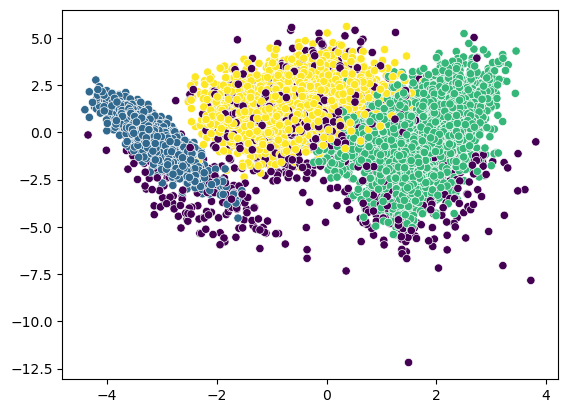

In [864]:
dbscan_cluster = DBSCAN(eps = 2, min_samples = 30, metric ='euclidean')
clusters_dbscan = dbscan_cluster.fit_predict(X_std)

sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], c=clusters_dbscan)
plt.show()

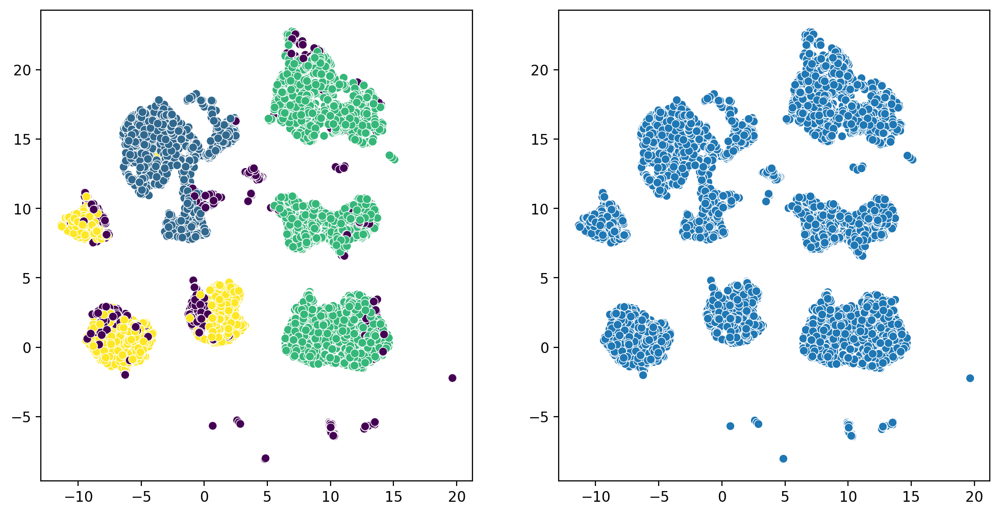

In [866]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(12,6),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], c=clusters_dbscan)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1])

plt.show()

### Gaussian mixture model

In [1343]:
gmm_cluster = GaussianMixture(n_components=7, random_state=123)
clusters_gmm = gmm_cluster.fit_predict(X_std)

print("The silhouette score of the GMM solution: {}"
.format(metrics.silhouette_score(X_std, clusters_gmm, metric='euclidean')))

The silhouette score of the GMM solution: 0.17979527666019318


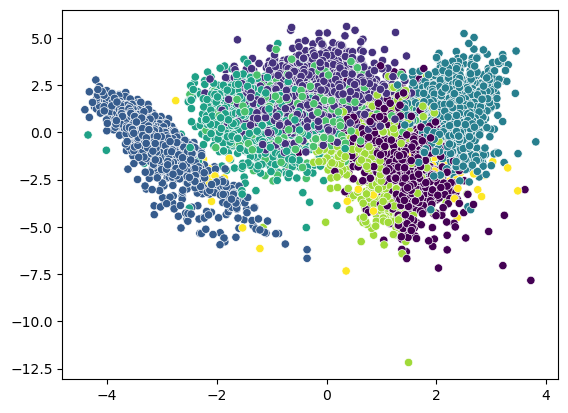

In [1337]:
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], c=clusters_gmm)
plt.show()

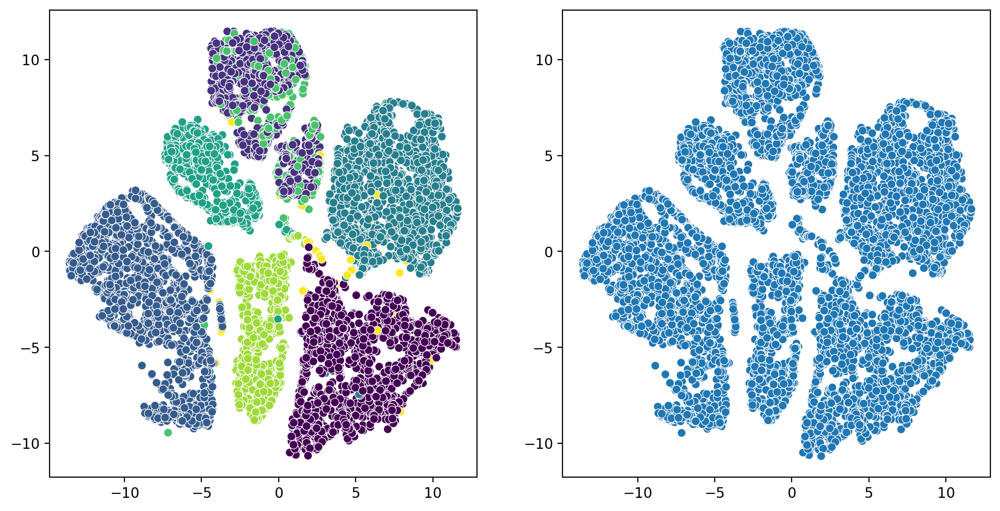

In [1341]:
plt.figure(figsize=(12,6),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], c=clusters_gmm)

plt.subplot(1,2,2)
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1])

plt.show()

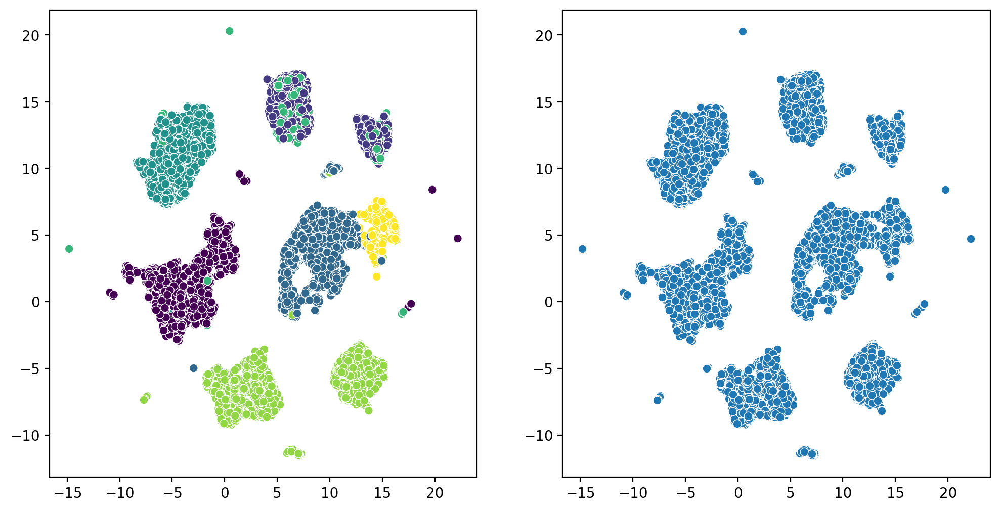

In [1349]:
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(12,6),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], c=clusters_gmm)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1])

plt.show()

By the `UMAP` solution, `7` clusters are easily distinguishable.

In [787]:
X_slct = df_select
scaler = StandardScaler()
X_slct_std = scaler.fit_transform(X_slct)

In [797]:
gmm_cluster = GaussianMixture(n_components=5, random_state=123)
clusters_gmm_slct = gmm_cluster.fit_predict(X_slct_std)

print("The Silhouette score of the GMM solution: {}"
.format(metrics.silhouette_score(X_slct_std, clusters_gmm_slct, metric='euclidean')))

The Silhouette score of the GMM solution: 0.20873833856386875


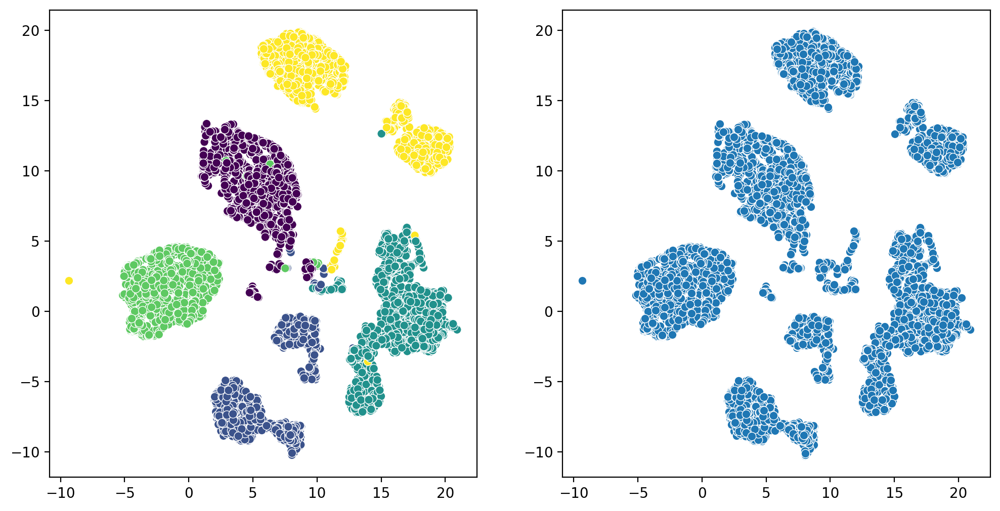

In [799]:
umap_results_slct = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_slct_std)

plt.figure(figsize=(12,6),dpi=200)
plt.subplot(1,2,1)
sns.scatterplot(x=umap_results_slct[:,0], y=umap_results_slct[:,1], c=clusters_gmm_slct)

plt.subplot(1,2,2)
sns.scatterplot(x=umap_results_slct[:,0], y=umap_results_slct[:,1])

plt.show()

### Inference from GMM clustering

In [1230]:
clusters_gmm_df = pd.DataFrame(clusters_gmm)
clusters_gmm_df.columns = ['GMM_clusters']

In [1228]:
X_df = pd.DataFrame(X)
X_df.columns = df_select.columns

In [1074]:
df_GMM = X_df.merge(clusters_gmm_df, left_index=True , right_index=True)
df_GMM.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,GMM_clusters
0,3.711148,-0.200670,4.558079,0.000000,4.558079,0.000000,-1.791757,0.000000,-2.484911,0.000000,0.000000,0.693147,6.907755,5.307287,4.938135,0.000000,0
1,8.071677,-0.095310,0.000000,0.000000,0.000000,8.770741,0.000000,0.000000,0.000000,-1.386294,1.386294,0.000000,8.853665,8.319482,6.977599,-1.504078,2
2,7.822104,0.000000,6.650499,6.650499,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.484907,8.922658,6.433047,6.441401,0.000000,5
3,7.418583,-0.451985,7.312553,7.312553,0.000000,5.326847,-2.484911,-2.484911,0.000000,-2.484911,0.000000,0.000000,8.922658,0.000000,6.761812,0.000000,5
4,6.706513,0.000000,2.772589,2.772589,0.000000,0.000000,-2.484911,-2.484911,0.000000,0.000000,0.000000,0.000000,7.090077,6.519641,5.500406,0.000000,5


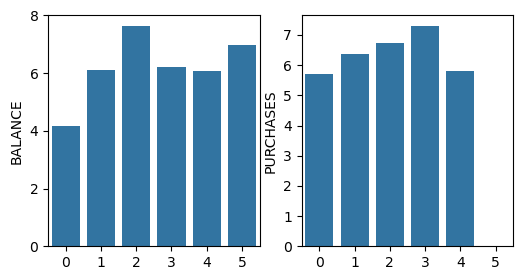

In [1246]:
plt.figure(figsize=(6,3), dpi=100)
plt.subplot(1,2,1)
sns.barplot(x= df_GMM['GMM_clusters'].unique(),
            y= df_GMM.groupby(['GMM_clusters'])['BALANCE'].mean())

plt.subplot(1,2,2)
sns.barplot(x= df_GMM['GMM_clusters'].unique(),
            y= df_GMM.groupby(['GMM_clusters'])['PURCHASES'].mean())
plt.show()

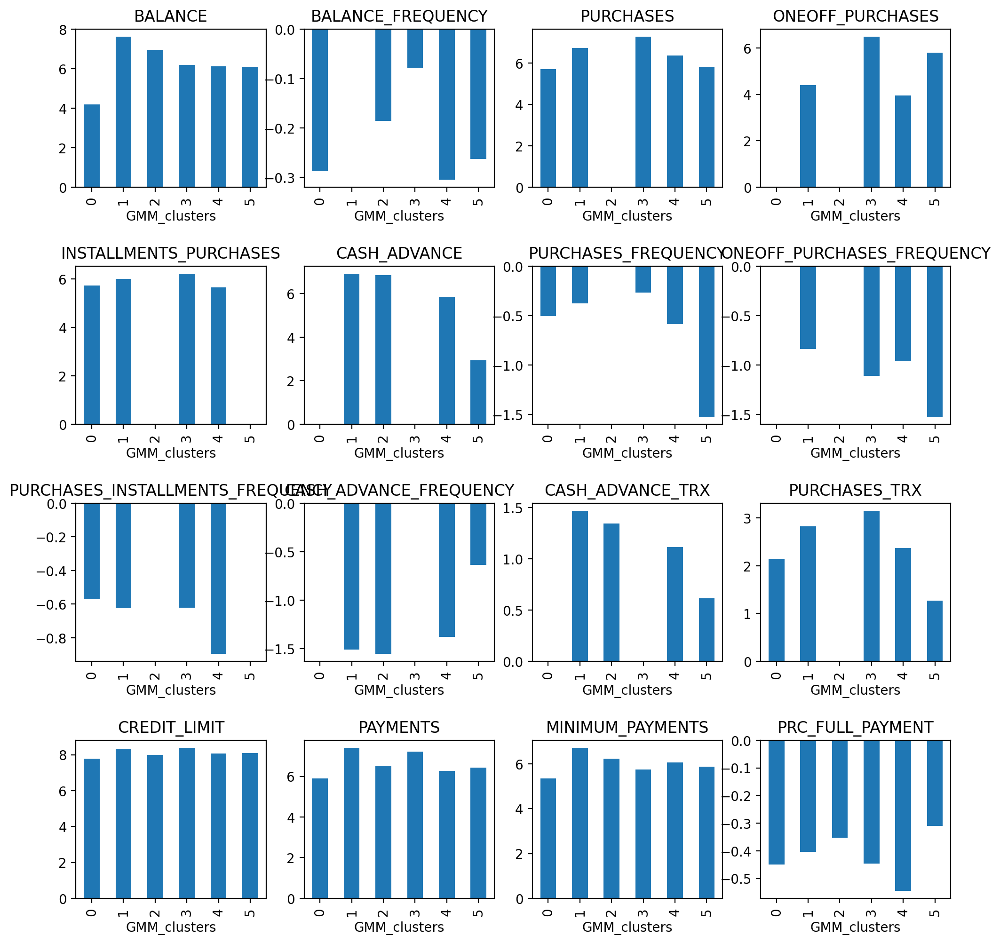

In [1234]:
col_list = df_select.columns
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(12,12), dpi=200)
plt.subplots_adjust(hspace=0.5)
for col, ax in zip(col_list, axs.ravel()):
    df_GMM.groupby(['GMM_clusters'])[col].mean().plot(kind='bar',ax=ax)
    ax.set_title(col)
plt.show()


By the `GMM clustering`, it is obvious that many of the features have close average values

### Inferences from Agglomerative Clustering

In [1249]:
clusters_agg_df = pd.DataFrame(clusters_agg)
clusters_agg_df.columns = ['AGG_clusters']

df_AGG = X_df.merge(clusters_agg_df, left_index=True , right_index=True)
df_AGG.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,AGG_clusters
0,3.711148,-0.200670,4.558079,0.000000,4.558079,0.000000,-1.791757,0.000000,-2.484911,0.000000,0.000000,0.693147,6.907755,5.307287,4.938135,0.000000,5
1,8.071677,-0.095310,0.000000,0.000000,0.000000,8.770741,0.000000,0.000000,0.000000,-1.386294,1.386294,0.000000,8.853665,8.319482,6.977599,-1.504078,0
2,7.822104,0.000000,6.650499,6.650499,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.484907,8.922658,6.433047,6.441401,0.000000,3
3,7.418583,-0.451985,7.312553,7.312553,0.000000,5.326847,-2.484911,-2.484911,0.000000,-2.484911,0.000000,0.000000,8.922658,0.000000,6.761812,0.000000,2
4,6.706513,0.000000,2.772589,2.772589,0.000000,0.000000,-2.484911,-2.484911,0.000000,0.000000,0.000000,0.000000,7.090077,6.519641,5.500406,0.000000,2


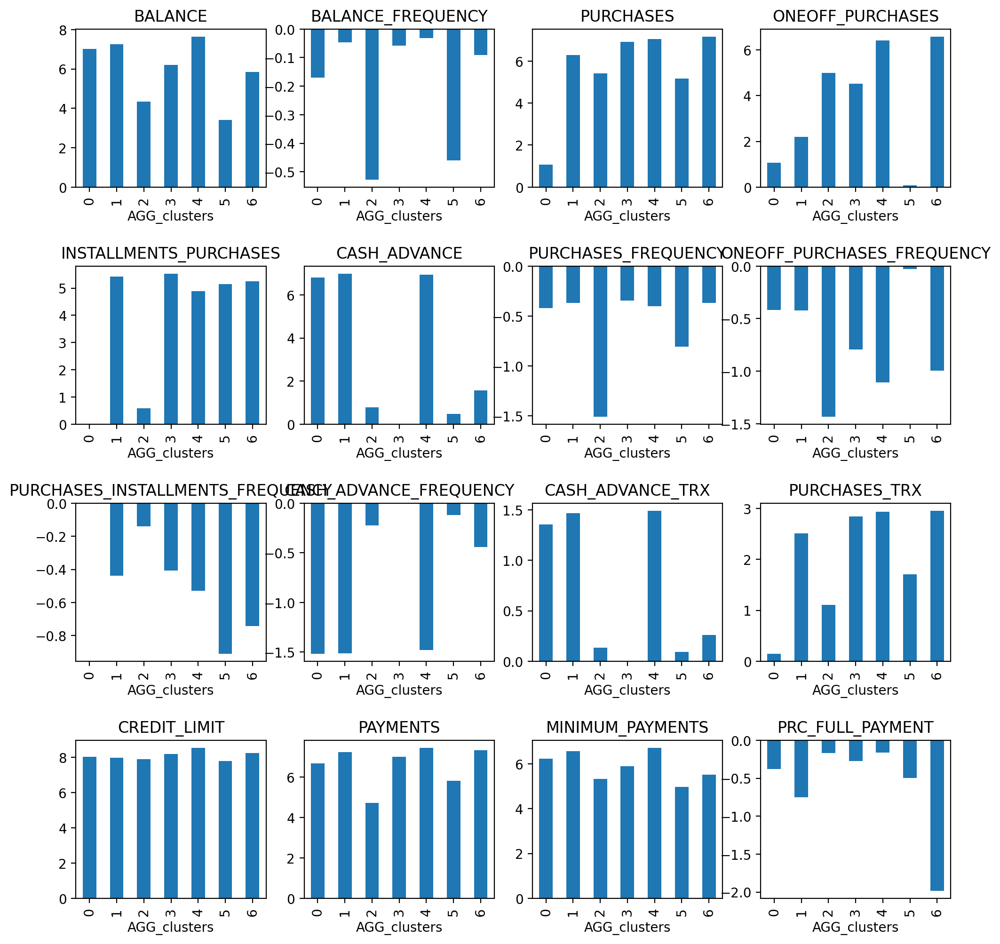

In [1251]:
col_list = df_select.columns
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(12,12), dpi=200)
plt.subplots_adjust(hspace=0.5)
for col, ax in zip(col_list, axs.ravel()):
    df_AGG.groupby(['AGG_clusters'])[col].mean().plot(kind='bar',ax=ax)
    ax.set_title(col)
plt.show()

Using `Agglomerative Clustering`, some features have very close average values, like:

- Purchases
- Credit_limit
- Payments
- Minimum_payments

## CONCLUSION

According to the results of each clustering method, both numeric and visually demonstrated, it seems that the best-performing models are:

- Agglomerative Clustering
- 
Gaussian Mixture Mod
- l
DBSAN 
